In [89]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')# cacher les warnings

In [90]:
def df_csv(url):
    data = pd.read_csv('dataset.csv')
    print(f"Nombre de ligne : {data.shape[0]}")
    print(f"Nombre de colonne : {data.shape[1]}")
    display(data.T)
    return data

In [91]:
data = df_csv('dataset.csv')

Nombre de ligne : 100000
Nombre de colonne : 28


,0,1,2,3,4,5,6,7,8,9,...,99990,99991,99992,99993,99994,99995,99996,99997,99998,99999
id,0x1602,0x1603,0x1604,0x1605,0x1606,0x1607,0x1608,0x1609,0x160e,0x160f,...,0x25fe0,0x25fe1,0x25fe6,0x25fe7,0x25fe8,0x25fe9,0x25fea,0x25feb,0x25fec,0x25fed
id_client,CUS_0xd40,CUS_0xd40,CUS_0xd40,CUS_0xd40,CUS_0xd40,CUS_0xd40,CUS_0xd40,CUS_0xd40,CUS_0x21b1,CUS_0x21b1,...,CUS_0x8600,CUS_0x8600,CUS_0x942c,CUS_0x942c,CUS_0x942c,CUS_0x942c,CUS_0x942c,CUS_0x942c,CUS_0x942c,CUS_0x942c
mois,Janvier,Février,Mars,Avril,Mai,Juin,Juillet,Août,Janvier,Février,...,Juillet,Août,Janvier,Février,Mars,Avril,Mai,Juin,Juillet,Août
nom,Aaron Maashoh,Aaron Maashoh,Aaron Maashoh,Aaron Maashoh,Aaron Maashoh,Aaron Maashoh,Aaron Maashoh,NaN,Rick Rothackerj,Rick Rothackerj,...,Sarah McBridec,Sarah McBridec,Nicks,Nicks,Nicks,Nicks,Nicks,Nicks,Nicks,Nicks
age,23,23,-500,23,23,23,23,23,28_,28,...,28,29,24,25,25,25,25,25,25,25
numero_securite_sociale,821-00-0265,821-00-0265,821-00-0265,821-00-0265,821-00-0265,821-00-0265,821-00-0265,#F%$D@*&8,004-07-5839,004-07-5839,...,031-35-0942,031-35-0942,078-73-5990,078-73-5990,078-73-5990,078-73-5990,078-73-5990,078-73-5990,078-73-5990,078-73-5990
profession,Scientifique,Scientifique,Scientifique,Scientifique,Scientifique,Scientifique,Scientifique,Scientifique,_______,Enseignant,...,Architecte,Architecte,Mécanicien,Mécanicien,Mécanicien,Mécanicien,Mécanicien,Mécanicien,Mécanicien,Mécanicien
revenu_annuel,19114.12,19114.12,19114.12,19114.12,19114.12,19114.12,19114.12,19114.12,34847.84,34847.84,...,20002.88,20002.88,39628.99,39628.99_,39628.99,39628.99,39628.99,39628.99,39628.99,39628.99_
salaire_net_mensuel,1824.84,NaN,NaN,NaN,1824.84,NaN,1824.84,1824.84,3037.99,3037.99,...,1929.91,1929.91,3359.42,3359.42,3359.42,3359.42,3359.42,3359.42,3359.42,3359.42
nb_comptes_bancaires,3,3,3,3,3,3,3,3,2,2,...,10,10,4,4,4,4,4,4,4,4


In [92]:
data.drop(columns=['nom', 'numero_securite_sociale'], inplace=True)

In [93]:
# list col 
df_columns = data.columns
col_id = ['id', 'id_client']
col_num_type = ['age', 'revenu_annuel', 'salaire_net_mensuel', 'nb_comptes_bancaires', 'nb_cartes_credit', 'taux_interet', 'nb_pret', 'retard_moyen_jours', 'nb_paiements_en_retard', 'variation_limite_credit', 'nb_demandes_credit', 'dette_restante', 'taux_utilisation_credit', 'anciennete_historique_credit', 'total_emi_mensuel', 'montant_investi_mensuel', 'solde_mensuel']

## Partie 1

### Nettoyez les variables numériques et catégorielles pour garantir leur cohérence et leur compatibilité avec les analyses ultérieures

In [94]:
def print_nunique(df, list_col, list_non_affiche=[]):
    for col in list_col:
        if col not in list_non_affiche :
            print(f"Nom colonne: {col}")
            print(f"Type de colonne : {df[col].dtypes}")
            print(f"Nombre de valeurs distinctes: {df[col].nunique()}")
            print(df[col].unique())
            print("---"*20)

In [95]:
print_nunique(data, df_columns, col_id)

Nom colonne: mois
Type de colonne : object
Nombre de valeurs distinctes: 8
['Janvier' 'Février' 'Mars' 'Avril' 'Mai' 'Juin' 'Juillet' 'Août']
------------------------------------------------------------
Nom colonne: age
Type de colonne : object
Nombre de valeurs distinctes: 1788
['23' '-500' '28_' ... '4808_' '2263' '1342']
------------------------------------------------------------
Nom colonne: profession
Type de colonne : object
Nombre de valeurs distinctes: 16
['Scientifique' '_______' 'Enseignant' 'Ingénieur' 'Entrepreneur'
 'Développeur' 'Avocat' 'Responsable médias' 'Médecin' 'Journaliste'
 'Gestionnaire' 'Comptable' 'Musicien' 'Mécanicien' 'Écrivain'
 'Architecte']
------------------------------------------------------------
Nom colonne: revenu_annuel
Type de colonne : object
Nombre de valeurs distinctes: 18940
['19114.12' '34847.84' '34847.84_' ... '20002.88' '39628.99' '39628.99_']
------------------------------------------------------------
Nom colonne: salaire_net_mensuel
T

In [96]:
data.replace(['!@9#%8', '_______', '_'], np.nan, inplace=True)
data.T

,0,1,2,3,4,5,6,7,8,9,...,99990,99991,99992,99993,99994,99995,99996,99997,99998,99999
id,0x1602,0x1603,0x1604,0x1605,0x1606,0x1607,0x1608,0x1609,0x160e,0x160f,...,0x25fe0,0x25fe1,0x25fe6,0x25fe7,0x25fe8,0x25fe9,0x25fea,0x25feb,0x25fec,0x25fed
id_client,CUS_0xd40,CUS_0xd40,CUS_0xd40,CUS_0xd40,CUS_0xd40,CUS_0xd40,CUS_0xd40,CUS_0xd40,CUS_0x21b1,CUS_0x21b1,...,CUS_0x8600,CUS_0x8600,CUS_0x942c,CUS_0x942c,CUS_0x942c,CUS_0x942c,CUS_0x942c,CUS_0x942c,CUS_0x942c,CUS_0x942c
mois,Janvier,Février,Mars,Avril,Mai,Juin,Juillet,Août,Janvier,Février,...,Juillet,Août,Janvier,Février,Mars,Avril,Mai,Juin,Juillet,Août
age,23,23,-500,23,23,23,23,23,28_,28,...,28,29,24,25,25,25,25,25,25,25
profession,Scientifique,Scientifique,Scientifique,Scientifique,Scientifique,Scientifique,Scientifique,Scientifique,NaN,Enseignant,...,Architecte,Architecte,Mécanicien,Mécanicien,Mécanicien,Mécanicien,Mécanicien,Mécanicien,Mécanicien,Mécanicien
revenu_annuel,19114.12,19114.12,19114.12,19114.12,19114.12,19114.12,19114.12,19114.12,34847.84,34847.84,...,20002.88,20002.88,39628.99,39628.99_,39628.99,39628.99,39628.99,39628.99,39628.99,39628.99_
salaire_net_mensuel,1824.84,NaN,NaN,NaN,1824.84,NaN,1824.84,1824.84,3037.99,3037.99,...,1929.91,1929.91,3359.42,3359.42,3359.42,3359.42,3359.42,3359.42,3359.42,3359.42
nb_comptes_bancaires,3,3,3,3,3,3,3,3,2,2,...,10,10,4,4,4,4,4,4,4,4
nb_cartes_credit,4,4,4,4,4,4,4,4,4,4,...,8,8,6,6,6,6,6,6,6,6
taux_interet,3,3,3,3,3,3,3,3,6,6,...,29,29,7,7,7,7,7,5729,7,7


#### NUMERIC

In [97]:
data.dtypes

id                               object
id_client                        object
mois                             object
age                              object
profession                       object
revenu_annuel                    object
salaire_net_mensuel             float64
nb_comptes_bancaires              int64
nb_cartes_credit                  int64
taux_interet                      int64
nb_pret                          object
type_pret                        object
retard_moyen_jours                int64
nb_paiements_en_retard           object
variation_limite_credit          object
nb_demandes_credit              float64
mix_credit                       object
dette_restante                   object
taux_utilisation_credit         float64
anciennete_historique_credit    float64
paiement_montant_minimum         object
total_emi_mensuel               float64
montant_investi_mensuel          object
comportement_paiement            object
solde_mensuel                    object


In [98]:
print_nunique(data, col_num_type)

Nom colonne: age
Type de colonne : object
Nombre de valeurs distinctes: 1788
['23' '-500' '28_' ... '4808_' '2263' '1342']
------------------------------------------------------------
Nom colonne: revenu_annuel
Type de colonne : object
Nombre de valeurs distinctes: 18940
['19114.12' '34847.84' '34847.84_' ... '20002.88' '39628.99' '39628.99_']
------------------------------------------------------------
Nom colonne: salaire_net_mensuel
Type de colonne : float64
Nombre de valeurs distinctes: 13235
[1824.84333333           nan 3037.98666667 ... 3097.00833333 1929.90666667
 3359.41583333]
------------------------------------------------------------
Nom colonne: nb_comptes_bancaires
Type de colonne : int64
Nombre de valeurs distinctes: 943
[   3    2    1    7    4    0    8    5    6    9   10 1414 1231   67
  572 1488   91  528 1647 1696 1338  649  889 1668  685  857  975 1496
 1534 1620   37 1388 1429 1332 1588  120 1777 1096  803  494  744 1139
  831 1613  741  121  665 1748 1644  823 

In [99]:
import re
for col in col_num_type:
    data[col] = data[col].apply(lambda x: re.sub(r'[^0-9.]', '', str(x)))
    data[col].replace(['nan', ''], np.nan, inplace=True)
    if data[col].dtypes not in ['float64', 'int64']:
        data[col] = pd.to_numeric(data[col], errors='coerce')

In [100]:
print_nunique(data, col_num_type)

Nom colonne: age
Type de colonne : int64
Nombre de valeurs distinctes: 1728
[  23  500   28 ... 4808 2263 1342]
------------------------------------------------------------
Nom colonne: revenu_annuel
Type de colonne : float64
Nombre de valeurs distinctes: 13487
[ 19114.12  34847.84 143162.64 ...  37188.1   20002.88  39628.99]
------------------------------------------------------------
Nom colonne: salaire_net_mensuel
Type de colonne : float64
Nombre de valeurs distinctes: 13235
[1824.84333333           nan 3037.98666667 ... 3097.00833333 1929.90666667
 3359.41583333]
------------------------------------------------------------
Nom colonne: nb_comptes_bancaires
Type de colonne : int64
Nombre de valeurs distinctes: 942
[   3    2    1    7    4    0    8    5    6    9   10 1414 1231   67
  572 1488   91  528 1647 1696 1338  649  889 1668  685  857  975 1496
 1534 1620   37 1388 1429 1332 1588  120 1777 1096  803  494  744 1139
  831 1613  741  121  665 1748 1644  823 1356 1651   87  71

In [101]:
data.T

,0,1,2,3,4,5,6,7,8,9,...,99990,99991,99992,99993,99994,99995,99996,99997,99998,99999
id,0x1602,0x1603,0x1604,0x1605,0x1606,0x1607,0x1608,0x1609,0x160e,0x160f,...,0x25fe0,0x25fe1,0x25fe6,0x25fe7,0x25fe8,0x25fe9,0x25fea,0x25feb,0x25fec,0x25fed
id_client,CUS_0xd40,CUS_0xd40,CUS_0xd40,CUS_0xd40,CUS_0xd40,CUS_0xd40,CUS_0xd40,CUS_0xd40,CUS_0x21b1,CUS_0x21b1,...,CUS_0x8600,CUS_0x8600,CUS_0x942c,CUS_0x942c,CUS_0x942c,CUS_0x942c,CUS_0x942c,CUS_0x942c,CUS_0x942c,CUS_0x942c
mois,Janvier,Février,Mars,Avril,Mai,Juin,Juillet,Août,Janvier,Février,...,Juillet,Août,Janvier,Février,Mars,Avril,Mai,Juin,Juillet,Août
age,23,23,500,23,23,23,23,23,28,28,...,28,29,24,25,25,25,25,25,25,25
profession,Scientifique,Scientifique,Scientifique,Scientifique,Scientifique,Scientifique,Scientifique,Scientifique,NaN,Enseignant,...,Architecte,Architecte,Mécanicien,Mécanicien,Mécanicien,Mécanicien,Mécanicien,Mécanicien,Mécanicien,Mécanicien
revenu_annuel,19114.12,19114.12,19114.12,19114.12,19114.12,19114.12,19114.12,19114.12,34847.84,34847.84,...,20002.88,20002.88,39628.99,39628.99,39628.99,39628.99,39628.99,39628.99,39628.99,39628.99
salaire_net_mensuel,1824.84,NaN,NaN,NaN,1824.84,NaN,1824.84,1824.84,3037.99,3037.99,...,1929.91,1929.91,3359.42,3359.42,3359.42,3359.42,3359.42,3359.42,3359.42,3359.42
nb_comptes_bancaires,3,3,3,3,3,3,3,3,2,2,...,10,10,4,4,4,4,4,4,4,4
nb_cartes_credit,4,4,4,4,4,4,4,4,4,4,...,8,8,6,6,6,6,6,6,6,6
taux_interet,3,3,3,3,3,3,3,3,6,6,...,29,29,7,7,7,7,7,5729,7,7


#### Categorie

In [102]:
col_object = list(data.select_dtypes(include='object').columns)

In [103]:
# import string

# str_sec = list(string.punctuation)
# str_sec.remove('/')
# str_sec
# for val in data['type_pret'].unique():
#     # if any(c in val for c in str_sec):
#         print(val)
print_nunique(data, col_object, col_id)


Nom colonne: mois
Type de colonne : object
Nombre de valeurs distinctes: 8
['Janvier' 'Février' 'Mars' 'Avril' 'Mai' 'Juin' 'Juillet' 'Août']
------------------------------------------------------------
Nom colonne: profession
Type de colonne : object
Nombre de valeurs distinctes: 15
['Scientifique' nan 'Enseignant' 'Ingénieur' 'Entrepreneur' 'Développeur'
 'Avocat' 'Responsable médias' 'Médecin' 'Journaliste' 'Gestionnaire'
 'Comptable' 'Musicien' 'Mécanicien' 'Écrivain' 'Architecte']
------------------------------------------------------------
Nom colonne: type_pret
Type de colonne : object
Nombre de valeurs distinctes: 6260
['Prêt automobile, Prêt pour constituer un crédit, Prêt personnel, Prêt sur valeur domiciliaire'
 'Prêt pour constituer un crédit'
 'Prêt automobile, Prêt automobile, Non spécifié' ...
 'Prêt sur valeur domiciliaire, Prêt automobile, Prêt automobile, Prêt automobile'
 'Prêt sur salaire, Prêt étudiant, Prêt hypothécaire, Non spécifié'
 'Prêt personnel, Prêt automo

### Gérez les valeurs manquantes

In [104]:
# data.replace('', np.nan, inplace=True)
print_nunique(data, df_columns, col_id)

Nom colonne: mois
Type de colonne : object
Nombre de valeurs distinctes: 8
['Janvier' 'Février' 'Mars' 'Avril' 'Mai' 'Juin' 'Juillet' 'Août']
------------------------------------------------------------
Nom colonne: age
Type de colonne : int64
Nombre de valeurs distinctes: 1728
[  23  500   28 ... 4808 2263 1342]
------------------------------------------------------------
Nom colonne: profession
Type de colonne : object
Nombre de valeurs distinctes: 15
['Scientifique' nan 'Enseignant' 'Ingénieur' 'Entrepreneur' 'Développeur'
 'Avocat' 'Responsable médias' 'Médecin' 'Journaliste' 'Gestionnaire'
 'Comptable' 'Musicien' 'Mécanicien' 'Écrivain' 'Architecte']
------------------------------------------------------------
Nom colonne: revenu_annuel
Type de colonne : float64
Nombre de valeurs distinctes: 13487
[ 19114.12  34847.84 143162.64 ...  37188.1   20002.88  39628.99]
------------------------------------------------------------
Nom colonne: salaire_net_mensuel
Type de colonne : float64


In [105]:
def visual_nan(df, seuil):
    data_count_null = df.isnull().sum()
    
    # Tính phần trăm giá trị null
    count_nan = (data_count_null / df.shape[0]) * 100
    
    # Tạo DataFrame cho biểu đồ
    df_na = count_nan.reset_index()
    df_na.columns = ['column', 'percent']
    
    # Vẽ biểu đồ thanh ngang
    seuil = seuil  # ví dụ ngưỡng, có thể thay đổi
    plt.figure(figsize=(8,6))
    plt.axvline(x=seuil, color='blue', linestyle='--', linewidth=1)
    sns.barplot(
        data=df_na, 
        x='percent', 
        y='column', 
        order=df_na.sort_values('percent', ascending=False)['column'], 
        color='tomato'
    )
    plt.xticks(range(0,101,10))
    plt.show
    return data_count_null.sort_values(ascending=False)

In [106]:
def col_nan(data_count_null):
    return list(data_count_null[data_count_null > 0].index)

mix_credit                      20195
salaire_net_mensuel             15002
type_pret                       11408
anciennete_historique_credit     9030
comportement_paiement            7600
profession                       7062
nb_paiements_en_retard           7002
montant_investi_mensuel          4479
variation_limite_credit          2091
nb_demandes_credit               1965
solde_mensuel                    1200
total_emi_mensuel                   0
paiement_montant_minimum            0
taux_utilisation_credit             0
dette_restante                      0
id                                  0
id_client                           0
retard_moyen_jours                  0
nb_pret                             0
taux_interet                        0
nb_cartes_credit                    0
nb_comptes_bancaires                0
revenu_annuel                       0
age                                 0
mois                                0
score_credit                        0
dtype: int64

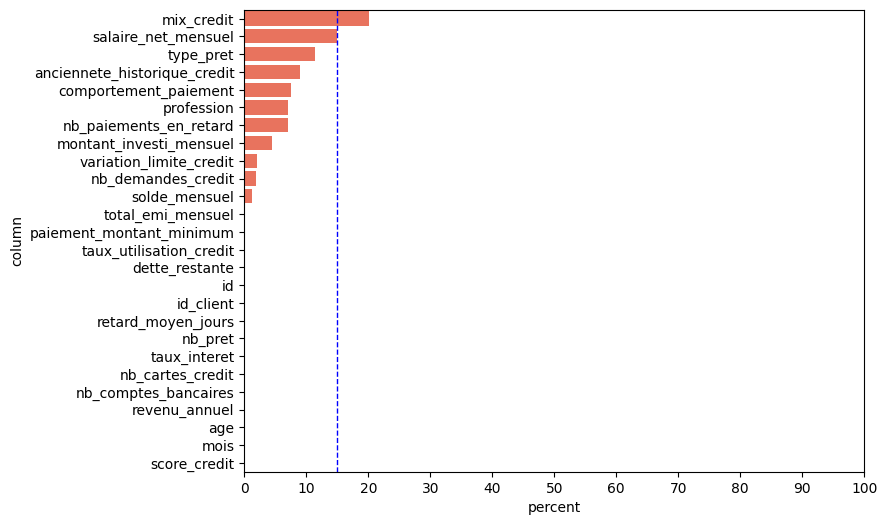

In [107]:
data_count_null = visual_nan(data, 15)
col_nan = col_nan(data_count_null)
data_count_null

In [108]:
print(data.dtypes)
data.T

id                               object
id_client                        object
mois                             object
age                               int64
profession                       object
revenu_annuel                   float64
salaire_net_mensuel             float64
nb_comptes_bancaires              int64
nb_cartes_credit                  int64
taux_interet                      int64
nb_pret                           int64
type_pret                        object
retard_moyen_jours                int64
nb_paiements_en_retard          float64
variation_limite_credit         float64
nb_demandes_credit              float64
mix_credit                       object
dette_restante                  float64
taux_utilisation_credit         float64
anciennete_historique_credit    float64
paiement_montant_minimum         object
total_emi_mensuel               float64
montant_investi_mensuel         float64
comportement_paiement            object
solde_mensuel                   float64


,0,1,2,3,4,5,6,7,8,9,...,99990,99991,99992,99993,99994,99995,99996,99997,99998,99999
id,0x1602,0x1603,0x1604,0x1605,0x1606,0x1607,0x1608,0x1609,0x160e,0x160f,...,0x25fe0,0x25fe1,0x25fe6,0x25fe7,0x25fe8,0x25fe9,0x25fea,0x25feb,0x25fec,0x25fed
id_client,CUS_0xd40,CUS_0xd40,CUS_0xd40,CUS_0xd40,CUS_0xd40,CUS_0xd40,CUS_0xd40,CUS_0xd40,CUS_0x21b1,CUS_0x21b1,...,CUS_0x8600,CUS_0x8600,CUS_0x942c,CUS_0x942c,CUS_0x942c,CUS_0x942c,CUS_0x942c,CUS_0x942c,CUS_0x942c,CUS_0x942c
mois,Janvier,Février,Mars,Avril,Mai,Juin,Juillet,Août,Janvier,Février,...,Juillet,Août,Janvier,Février,Mars,Avril,Mai,Juin,Juillet,Août
age,23,23,500,23,23,23,23,23,28,28,...,28,29,24,25,25,25,25,25,25,25
profession,Scientifique,Scientifique,Scientifique,Scientifique,Scientifique,Scientifique,Scientifique,Scientifique,NaN,Enseignant,...,Architecte,Architecte,Mécanicien,Mécanicien,Mécanicien,Mécanicien,Mécanicien,Mécanicien,Mécanicien,Mécanicien
revenu_annuel,19114.12,19114.12,19114.12,19114.12,19114.12,19114.12,19114.12,19114.12,34847.84,34847.84,...,20002.88,20002.88,39628.99,39628.99,39628.99,39628.99,39628.99,39628.99,39628.99,39628.99
salaire_net_mensuel,1824.84,NaN,NaN,NaN,1824.84,NaN,1824.84,1824.84,3037.99,3037.99,...,1929.91,1929.91,3359.42,3359.42,3359.42,3359.42,3359.42,3359.42,3359.42,3359.42
nb_comptes_bancaires,3,3,3,3,3,3,3,3,2,2,...,10,10,4,4,4,4,4,4,4,4
nb_cartes_credit,4,4,4,4,4,4,4,4,4,4,...,8,8,6,6,6,6,6,6,6,6
taux_interet,3,3,3,3,3,3,3,3,6,6,...,29,29,7,7,7,7,7,5729,7,7


### Concertir type de données

In [109]:
# col_int = ['age', 'nb_comptes_bancaires', 'nb_cartes_credit', 'taux_interet', 'taux_interet', 'retard_moyen_jours', 'nb_paiements_en_retard', 'nb_demandes_credit']
# col_float = ['revenu_annuel', 'variation_limite_credit', 'dette_restante', 'taux_utilisation_credit', 'anciennete_historique_credit', 'total_emi_mensuel', 'montant_investi_mensuel', 'solde_mensuel']

# def convert_type_col(list_col, type_col, data=data, list_col_nan=None):
#     for col in list_col:
#         if list_col_nan and len(list_col_nan) > 0:
#             if col not in list_col_nan:
#                 data[col] = data[col].astype(type_col)
#         else:
#             data[col] = data[col].astype(type_col)

In [110]:
# convert_type_col(col_int, 'int', data, col_nan)
# convert_type_col(col_float, 'float', data, col_nan)
# data[col_int].dtypes
# data[col_float].dtypes

### Remplacer valeur manquants

In [111]:
# remplacer valeur manquants par groupby 'id_client'
def imputer_par_id_client(df, list_col):
    for col in list_col:
        df[col] = df.groupby('id_client')[col].transform(
            lambda x: x.fillna(x.mode()[0] if not x.mode().empty else np.nan)
        )

In [112]:
col_group_by_id_client = ['mix_credit', 'profession', 'nb_demandes_credit']
imputer_par_id_client(data, col_group_by_id_client)

Nom colonne: mix_credit
Type de colonne : object
Nombre de valeurs distinctes: 3
['Good' 'Standard' 'Bad']
------------------------------------------------------------
Nom colonne: profession
Type de colonne : object
Nombre de valeurs distinctes: 15
['Scientifique' 'Enseignant' 'Ingénieur' 'Entrepreneur' 'Développeur'
 'Avocat' 'Responsable médias' 'Médecin' 'Journaliste' 'Gestionnaire'
 'Comptable' 'Musicien' 'Mécanicien' 'Écrivain' 'Architecte']
------------------------------------------------------------
Nom colonne: nb_demandes_credit
Type de colonne : float64
Nombre de valeurs distinctes: 1223
[   4.    2.    3. ... 1361.  310.   74.]
------------------------------------------------------------


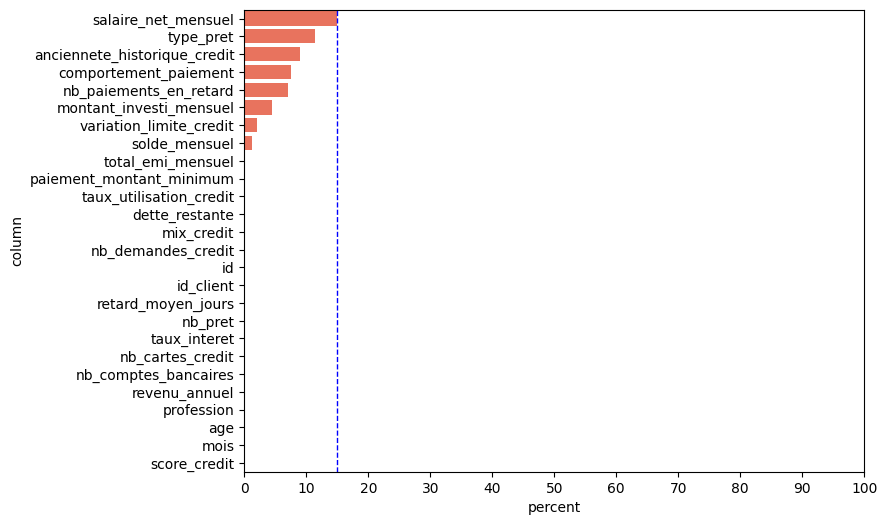

In [113]:
col_nan_groupby = visual_nan(data, 15)
print_nunique(data, col_group_by_id_client)

In [114]:
# visual_nan(data_drop_net_nom, 15)
# data_drop_net_mensuel = data.drop(columns='salaire_net_mensuel')
data_drop_net_mensuel = data.copy()

salaire_net_mensuel             15002
type_pret                       11408
anciennete_historique_credit     9030
comportement_paiement            7600
nb_paiements_en_retard           7002
montant_investi_mensuel          4479
variation_limite_credit          2091
solde_mensuel                    1200
total_emi_mensuel                   0
paiement_montant_minimum            0
taux_utilisation_credit             0
dette_restante                      0
mix_credit                          0
nb_demandes_credit                  0
id                                  0
id_client                           0
retard_moyen_jours                  0
nb_pret                             0
taux_interet                        0
nb_cartes_credit                    0
nb_comptes_bancaires                0
revenu_annuel                       0
profession                          0
age                                 0
mois                                0
score_credit                        0
dtype: int64

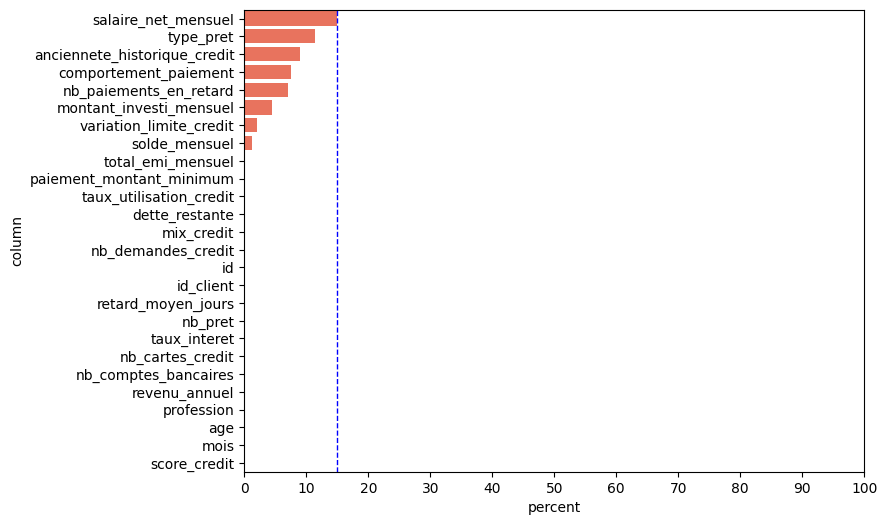

In [115]:
visual_nan(data_drop_net_mensuel, 15)

In [116]:
# ta co the thay rang mot khi da trong thi se trong tat ca cac hang
# data_check = data_drop_net_mensuel[data_drop_net_mensuel['type_pret'].isnull()]
# data_check['type_pret']
data_drop_net_mensuel['type_pret'].iloc[:50]

0     Prêt automobile, Prêt pour constituer un crédi...
1     Prêt automobile, Prêt pour constituer un crédi...
2     Prêt automobile, Prêt pour constituer un crédi...
3     Prêt automobile, Prêt pour constituer un crédi...
4     Prêt automobile, Prêt pour constituer un crédi...
5     Prêt automobile, Prêt pour constituer un crédi...
6     Prêt automobile, Prêt pour constituer un crédi...
7     Prêt automobile, Prêt pour constituer un crédi...
8                        Prêt pour constituer un crédit
9                        Prêt pour constituer un crédit
10                       Prêt pour constituer un crédit
11                       Prêt pour constituer un crédit
12                       Prêt pour constituer un crédit
13                       Prêt pour constituer un crédit
14                       Prêt pour constituer un crédit
15                       Prêt pour constituer un crédit
16       Prêt automobile, Prêt automobile, Non spécifié
17       Prêt automobile, Prêt automobile, Non s

In [117]:
data_drop_net_mensuel['type_pret'].nunique()
# data_drop_net_mensuel['type_pret'].unique()

6260

#### Valeur abberantes

In [118]:
pd.set_option('display.float_format', '{:.2f}'.format)
data_drop_net_mensuel.describe(include='number')

,age,revenu_annuel,salaire_net_mensuel,nb_comptes_bancaires,nb_cartes_credit,taux_interet,nb_pret,retard_moyen_jours,nb_paiements_en_retard,variation_limite_credit,nb_demandes_credit,dette_restante,taux_utilisation_credit,anciennete_historique_credit,total_emi_mensuel,montant_investi_mensuel,solde_mensuel
count,100000.00,100000.00,84998.00,100000.00,100000.00,100000.00,100000.00,100000.00,92998.00,97909.00,100000.00,100000.00,100000.00,90970.00,100000.00,95521.00,98800.00
mean,119.51,176415.70,4194.17,17.09,22.47,72.47,10.76,21.10,30.95,10.47,27.32,1426.22,32.29,221.20,1403.12,637.41,30364372469635625254912.00
std,684.76,1429618.05,3183.69,117.40,129.06,466.42,61.79,14.82,226.03,6.67,191.30,1155.13,5.12,99.74,8306.04,2043.32,3181295008384109317718016.00
min,14.00,7005.93,303.65,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.23,20.00,1.00,0.00,0.00,0.01
25%,25.00,19457.50,1625.57,3.00,4.00,8.00,2.00,10.00,9.00,5.35,3.00,566.07,28.05,144.00,30.31,74.53,270.11
50%,34.00,37578.61,3093.75,6.00,5.00,13.00,3.00,18.00,14.00,9.40,6.00,1166.15,32.31,219.00,69.25,135.93,336.74
75%,42.00,72790.92,5957.45,7.00,7.00,20.00,6.00,28.00,18.00,14.87,9.00,1945.96,36.50,302.00,161.22,265.73,470.33
max,8698.00,24198062.00,15204.63,1798.00,1499.00,5797.00,1496.00,67.00,4397.00,36.97,2597.00,4998.07,50.00,404.00,82331.00,10000.00,333333333333333314856026112.00


In [119]:
col_num_test = data_drop_net_mensuel.select_dtypes(include='number')
# col_num_abberant = [col for col in col_num_type if col not in ['salaire_net_mensuel', 'retard_moyen_jours', 'variation_limite_credit', 'taux_utilisation_credit', 'anciennete_historique_credit']]
col_num_abberant = [col for col in col_num_type if col not in ['retard_moyen_jours', 'variation_limite_credit', 'taux_utilisation_credit', 'anciennete_historique_credit']]

In [120]:
import plotly.express as px
import plotly.graph_objects as go

In [121]:
def visualisation_outlier(df, list_col):
    for col in list_col:
        fig = go.Figure()
        fig.add_trace(go.Box(x=df[col]))
        fig.update_layout(title=f"Box plot log de {col.upper()}", xaxis_title=col)
        fig.update_xaxes(type="log") 
        fig.show()
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        print(f"Q1: {Q1}; Q3 : {Q3}")
        print(f"Lower fence: {Q1 - 1.5*IQR}; Upper fence: {Q3 + 1.5*IQR}")
        fig2 = px.histogram(df, x=col)
        fig2.update_layout(yaxis_type='log') 
        fig2.show()

In [122]:
# visualisation_outlier(data_drop_net_mensuel, col_num_test)

In [123]:
# 'salaire_net_mensuel', 'retard_moyen_jours', 'variation_limite_credit', 'taux_utilisation_credit', 'anciennete_historique_credit'
# 'retard_moyen_jours', 'variation_limite_credit'
# 'dette_restante', 'taux_utilisation_credit', 'variation_limite_credit', 'retard_moyen_jours', vẫn ở mức có thể chấp nhận được
# 'solde_mensuel', 'montant_investi_mensuel', 'total_emi_mensuel', 'revenu_mensuel', xem lại bằng biểu đồ cột hoặc boxplot With Only Points

In [124]:
# col_in1 = ['solde_mensuel', 'montant_investi_mensuel', 'total_emi_mensuel', 'revenu_annuel', 'dette_restante', 'taux_utilisation_credit', 'variation_limite_credit', 'retard_moyen_jours']

In [125]:
def ana_col(data, col, taux, seuil_p, seuil_g=None):
    if seuil_g:
        df = data[(data[col] > seuil_p) & (data[col] < seuil_g)]
    else:
        df = data[(data[col] > seuil_p)]
    id_client = df['id_client']
    list_out = list(set(id_client.to_list()))
    # list_sup = list_out[:nb]

    for cli in list_out:
        dft = data[data['id_client']==cli]
        val_dis = list(set(list(dft[col].sort_values(ascending=False))))
        if len(val_dis) >= 2:
            # mode_df.sort_values(ascending=False, inplace=True, ignore_index=True)
            if val_dis[0] > val_dis[1]*taux:
                display(dft.T)  
                display('--'*50)

In [126]:
# # 'revenu_annuel' sau 200K có rải rác một ít
# ana_col(data_drop_net_mensuel, 'revenu_annuel', 2, 150000, 180000)
# # sau 200K deu la gia tri loi
# # nen thay sau 200k

In [127]:
# ana_col(data_drop_net_mensuel, 'salaire_net_mensuel', 1., 14700, 15500)
# # cac gia tri on khong co su tang qua manh, thuong la do tang hay doi mot vai thang luong
# data_drop_net_mensuel[data_drop_net_mensuel['salaire_net_mensuel'] >= 15200].T
# # CUS_0xbc

In [128]:
# ana_col(data_drop_net_mensuel, 'taux_interet', 1., 33, 41)
# # cac gia tri on khong co su tang qua manh, thuong la do tang hay doi mot vai thang luong
# # data_drop_net_mensuel[data_drop_net_mensuel['taux_interet'] == 34]
# # DUNG IQR

In [129]:
# ana_col(data_drop_net_mensuel, 'nb_pret', 1.5, 10, 41)
# # cac gia tri on khong co su tang qua manh, thuong la do tang hay doi mot vai thang luong
# # DUNG IQR 

In [130]:
# # 'retard_moyen_jours' sau 62 co mot su giam dot ngot nen xem thu la do lu lieu nhap sai hay khong
# ana_col(data_drop_net_mensuel, 'retard_moyen_jours', 1.1, 66, 70)
# # oe day ty le khq dong deu va do chenh lech khong dang ke

# # 'solde_mensuel' 1k6, 'montant_investi_mensuel', 'total_emi_mensuel', 'revenu_annuel' có dữ liệu trải dài đáng ngờ, 

In [131]:
# # 'retard_moyen_jours' sau 62 co mot su giam dot ngot nen xem thu la do lu lieu nhap sai hay khong
# # ana_col(data_drop_net_mensuel, 'nb_paiements_en_retard', 1, 45, 51)
# # oe day ty le khq dong deu va do chenh lech khong dang ke
# # data_drop_net_mensuel[data_drop_net_mensuel['nb_paiements_en_retard'] == 47].T
# data_drop_net_mensuel[data_drop_net_mensuel['id_client'] == 'CUS_0x3e51'].T
# # CUS_0x2b84, CUS_0x4cb5, CUS_0x3e51

In [132]:
# # 'retard_moyen_jours' sau 62 co mot su giam dot ngot nen xem thu la do lu lieu nhap sai hay khong
# ana_col(data_drop_net_mensuel, 'variation_limite_credit', 1.5, 33, 40)
# # oe day ty le khq dong deu va do chenh lech khong dang ke
# data_drop_net_mensuel[data_drop_net_mensuel['variation_limite_credit'] >= 30].T
# # data_drop_net_mensuel[data_drop_net_mensuel['id_client'] == 'CUS_0x384c'].T

In [133]:
# # 'retard_moyen_jours' sau 62 co mot su giam dot ngot nen xem thu la do lu lieu nhap sai hay khong
# ana_col(data_drop_net_mensuel, 'nb_demandes_credit', 1, 25, 35)
# # oe day ty le khq dong deu va do chenh lech khong dang ke
# # data_drop_net_mensuel[data_drop_net_mensuel['nb_paiements_en_retard'] == 47].T

In [134]:
# # 'retard_moyen_jours' sau 62 co mot su giam dot ngot nen xem thu la do lu lieu nhap sai hay khong
# ana_col(data_drop_net_mensuel, 'dette_restante', 1.1, 4000, 5000)
# # oe day ty le khq dong deu va do chenh lech khong dang ke
# data_drop_net_mensuel[data_drop_net_mensuel['dette_restante'] >= 4200].T

In [135]:
# # 'retard_moyen_jours' sau 62 co mot su giam dot ngot nen xem thu la do lu lieu nhap sai hay khong
# ana_col(data_drop_net_mensuel, 'taux_utilisation_credit', 1.1, 45, 60)
# # oe day ty le khq dong deu va do chenh lech khong dang ke

In [136]:
# # 'retard_moyen_jours' sau 62 co mot su giam dot ngot nen xem thu la do lu lieu nhap sai hay khong
# ana_col(data_drop_net_mensuel, 'anciennete_historique_credit', 1, 400, 600)
# # oe day ty le khq dong deu va do chenh lech khong dang ke
# data_drop_net_mensuel[data_drop_net_mensuel['anciennete_historique_credit'] >= 400].T
# data_drop_net_mensuel[data_drop_net_mensuel['id_client'] == 'CUS_0xac86'].T
# total_emi_mensuel	montant_investi_mensuel	solde_mensuel
# CUS_0xac86

In [137]:
# # 'retard_moyen_jours' sau 62 co mot su giam dot ngot nen xem thu la do lu lieu nhap sai hay khong
# ana_col(data_drop_net_mensuel, 'total_emi_mensuel', 1.2, 1700, 1900)
# # oe day ty le khq dong deu va do chenh lech khong dang ke
# data_drop_net_mensuel[data_drop_net_mensuel['anciennete_historique_credit'] >= 400].T
# data_drop_net_mensuel[data_drop_net_mensuel['id_client'] == 'CUS_0xac86'].T
# montant_investi_mensuel	solde_mensuel
# CUS_0xac86

In [138]:
# ana_col(data_drop_net_mensuel, 'montant_investi_mensuel', 1.5, 1000, 1400)
# # ta co the thay duoc duoi 2k deu la gia tri that, outlier o day la 10K
# # nen xu ly neu du lieu lon hon 3K

In [139]:
# ana_col(data_drop_net_mensuel, 'solde_mensuel', 1.2, 1400, 1700)
# # o day ty le sai rat lon, kha nang la do nhap nham
# # nen sua lai sau gia tri 1k7

# # 'solde_mensuel' 1k6, 'montant_investi_mensuel', 'total_emi_mensuel', 'revenu_annuel' có dữ liệu trải dài đáng ngờ, 

#### colonne sans outlier : retard_moyen_jours, variation_limite_credit, dette_restante, taux_utilisation_credit, anciennete_historique_credit, salaire_net_mensuel

#### Avec IQR : nb_demandes_credit, nb_paiements_en_retard, nb_comptes_bancaires, nb_cartes_credit, taux_interet, nb_pret, age
#### Avec limit : revenu_annuel : 200k, total_emi_mensuel : 1k9, montant_investi_mensuel : 1k9, solde_mensuel : 1k7

In [140]:
# # so sanh giua IQR va Z-score
# from scipy import stats
# for col in col_num_abberant:
#     Q1 = data_drop_net_mensuel[col].quantile(0.25)
#     Q3 = data_drop_net_mensuel[col].quantile(0.75)
#     IQR = Q3 - Q1
#     print(f"Columns : {col}")
#     print(f"Count IQR : {len(data_drop_net_mensuel[(data_drop_net_mensuel[col] < Q1 - 1.5*IQR) | (data_drop_net_mensuel[col] > Q3 + 1.5*IQR)])}")
#     print(IQR)
#     z_scores = stats.zscore(data_drop_net_mensuel[col])
#     print(f"Max : {z_scores.max()}, Min : {z_scores.min()}")
#     print(f"Count Z_score: {sum(z_scores > 3)}")
#     print("--"*20)
list_outlier_IQR = ['nb_demandes_credit', 'nb_paiements_en_retard', 'nb_comptes_bancaires', 'nb_cartes_credit', 'taux_interet', 'nb_pret', 'age']
list_outlier_limit = {'revenu_annuel':201000, 'total_emi_mensuel':1700, 'montant_investi_mensuel':1500, 'solde_mensuel' : 1700}

data_sup_outlier = data_drop_net_mensuel.copy()


In [141]:
def sup_outlier(df, list_col, IQR_mode=True):
    if IQR_mode:
        for col in list_col:
            Q1 = df[col].quantile(0.25)
            Q3 = df[col].quantile(0.75)
            IQR = Q3 - Q1

            for index, val in df[col].items():
                if (val < Q1 - 1.5*IQR) or (val > Q3 + 1.5*IQR):
                    df[col].iloc[index] = np.nan
    else:
        for col, val_col in list_col.items(): 
            for index, val in df[col].items():
                if val > val_col:
                    df[col].iloc[index] = np.nan

In [142]:
# for col in list_outlier_IQR:
#     Q1 = data_drop_net_mensuel[col].quantile(0.25)
#     Q3 = data_drop_net_mensuel[col].quantile(0.75)
#     IQR = Q3 - Q1
    
#     for index, val in data_drop_net_mensuel[col].items():
#         if (val < Q1 - 1.5*IQR) or (val > Q3 + 1.5*IQR):
#             data_drop_net_mensuel[col].iloc[index] = np.nan
# for col, val_col in list_outlier_limit.items():

#     for index, val in data_drop_net_mensuel[col].items():
#         if val > val_col:
#             data_drop_net_mensuel[col].iloc[index] = np.nan

In [143]:
sup_outlier(data_sup_outlier, list_outlier_IQR)
sup_outlier(data_sup_outlier, list_outlier_limit, False)

In [144]:
# visualisation_outlier(data_sup_outlier, col_num_test)

In [145]:
data_sup_outlier.describe()

,age,revenu_annuel,salaire_net_mensuel,nb_comptes_bancaires,nb_cartes_credit,taux_interet,nb_pret,retard_moyen_jours,nb_paiements_en_retard,variation_limite_credit,nb_demandes_credit,dette_restante,taux_utilisation_credit,anciennete_historique_credit,total_emi_mensuel,montant_investi_mensuel,solde_mensuel
count,97219.00,99001.00,84998.00,98685.00,97729.00,97966.00,95652.00,100000.00,92262.00,97909.00,98350.00,100000.00,100000.00,90970.00,96861.00,91149.00,98791.00
mean,33.32,50497.58,4194.17,5.37,5.53,14.53,3.53,21.10,13.34,10.47,5.78,1426.22,32.29,221.20,107.26,194.45,402.55
std,10.77,38296.62,3183.69,2.59,2.07,8.74,2.45,14.82,6.26,6.67,3.86,1155.13,5.12,99.74,129.88,195.50,213.93
min,14.00,7005.93,303.65,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.23,20.00,1.00,0.00,0.00,0.01
25%,24.00,19344.27,1625.57,3.00,4.00,7.00,2.00,10.00,9.00,5.35,3.00,566.07,28.05,144.00,29.30,72.21,270.11
50%,33.00,36993.94,3093.75,5.00,5.00,13.00,3.00,18.00,14.00,9.40,5.00,1166.15,32.31,219.00,66.46,128.86,336.73
75%,42.00,71676.00,5957.45,7.00,7.00,20.00,5.00,28.00,18.00,14.87,8.00,1945.96,36.50,302.00,147.05,236.40,470.26
max,56.00,179987.28,15204.63,11.00,11.00,34.00,9.00,67.00,28.00,36.97,17.00,4998.07,50.00,404.00,1698.00,1497.71,1602.04


#### VALEURS INCOHÉRENTES

In [146]:
data_coherent = data_sup_outlier.copy()
# data_coherent[['age', 'anciennete_historique_credit']].describe()

In [147]:
# # data_coherent['profession'].unique()
# for index, val in 

In [148]:
# AGE
min_age_profession = {
    # PROFESSIONS RÉGLEMENTÉES - BẮT BUỘC BẰNG CẤP
    'Médecin': 26,           # Doctorat en médecine - réglementé
    'Avocat': 24,            # Master droit + CAPA - réglementé  
    'Architecte': 24,        # Diplôme d'Architecte DE - réglementé
    'Ingénieur': 23,         # Diplôme d'ingénieur - titre protégé
    'Scientifique': 23,      # Master/Doctorat - recherche académique
    'Enseignant': 23,        # Master MEEF - concours requis
    'Journaliste': 22,       # Carte de presse - formation spécifique
    'Comptable': 21,         # DCG/DSCG - diplôme requis
    'Gestionnaire': 21,      # Licence/BTS - formation formelle
    
    # KHÔNG BAO GỒM các nghề freelance/không cần bằng:
    # 'Entrepreneur', 'Développeur', 'Responsable médias', 
    # 'Musicien', 'Mécanicien', 'Écrivain'
}

for pro, age_min in min_age_profession.items():
    for i in data_coherent[(data_coherent['profession'] == pro)&(data_coherent['age'] < age_min)].index:
        data_coherent['age'].iloc[i] = np.nan

for index, val in data_coherent['age'].items():
    if val < 18:
        data_coherent['age'].iloc[index] = np.nan

In [149]:
display(data_coherent.describe())
visualisation_outlier(data_coherent, ['age'])
        # data_coherent['age'].iloc[i] = np.nan

# data_coherent[(data_sup_outlier['profession'] == 'Médecin')&(data_coherent['age'] < 26)]
    # print(ligne)
# n = 0
# while(n<10):
# for val in data_sup_outlier['profession']:
    # print(val)
    # if val == 'Médecin':
    #     if
    #     print(data_sup_outlier['age'])

,age,revenu_annuel,salaire_net_mensuel,nb_comptes_bancaires,nb_cartes_credit,taux_interet,nb_pret,retard_moyen_jours,nb_paiements_en_retard,variation_limite_credit,nb_demandes_credit,dette_restante,taux_utilisation_credit,anciennete_historique_credit,total_emi_mensuel,montant_investi_mensuel,solde_mensuel
count,83099.00,99001.00,84998.00,98685.00,97729.00,97966.00,95652.00,100000.00,92262.00,97909.00,98350.00,100000.00,100000.00,90970.00,96861.00,91149.00,98791.00
mean,35.86,50497.58,4194.17,5.37,5.53,14.53,3.53,21.10,13.34,10.47,5.78,1426.22,32.29,221.20,107.26,194.45,402.55
std,9.48,38296.62,3183.69,2.59,2.07,8.74,2.45,14.82,6.26,6.67,3.86,1155.13,5.12,99.74,129.88,195.50,213.93
min,18.00,7005.93,303.65,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.23,20.00,1.00,0.00,0.00,0.01
25%,28.00,19344.27,1625.57,3.00,4.00,7.00,2.00,10.00,9.00,5.35,3.00,566.07,28.05,144.00,29.30,72.21,270.11
50%,35.00,36993.94,3093.75,5.00,5.00,13.00,3.00,18.00,14.00,9.40,5.00,1166.15,32.31,219.00,66.46,128.86,336.73
75%,43.00,71676.00,5957.45,7.00,7.00,20.00,5.00,28.00,18.00,14.87,8.00,1945.96,36.50,302.00,147.05,236.40,470.26
max,56.00,179987.28,15204.63,11.00,11.00,34.00,9.00,67.00,28.00,36.97,17.00,4998.07,50.00,404.00,1698.00,1497.71,1602.04


Q1: 28.0; Q3 : 43.0
Lower fence: 5.5; Upper fence: 65.5


In [150]:
imputer_par_id_client(data_coherent, ['age'])

In [151]:
display(data_coherent.describe())
visualisation_outlier(data_coherent, ['age'])

,age,revenu_annuel,salaire_net_mensuel,nb_comptes_bancaires,nb_cartes_credit,taux_interet,nb_pret,retard_moyen_jours,nb_paiements_en_retard,variation_limite_credit,nb_demandes_credit,dette_restante,taux_utilisation_credit,anciennete_historique_credit,total_emi_mensuel,montant_investi_mensuel,solde_mensuel
count,86032.00,99001.00,84998.00,98685.00,97729.00,97966.00,95652.00,100000.00,92262.00,97909.00,98350.00,100000.00,100000.00,90970.00,96861.00,91149.00,98791.00
mean,35.76,50497.58,4194.17,5.37,5.53,14.53,3.53,21.10,13.34,10.47,5.78,1426.22,32.29,221.20,107.26,194.45,402.55
std,9.52,38296.62,3183.69,2.59,2.07,8.74,2.45,14.82,6.26,6.67,3.86,1155.13,5.12,99.74,129.88,195.50,213.93
min,18.00,7005.93,303.65,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.23,20.00,1.00,0.00,0.00,0.01
25%,28.00,19344.27,1625.57,3.00,4.00,7.00,2.00,10.00,9.00,5.35,3.00,566.07,28.05,144.00,29.30,72.21,270.11
50%,35.00,36993.94,3093.75,5.00,5.00,13.00,3.00,18.00,14.00,9.40,5.00,1166.15,32.31,219.00,66.46,128.86,336.73
75%,43.00,71676.00,5957.45,7.00,7.00,20.00,5.00,28.00,18.00,14.87,8.00,1945.96,36.50,302.00,147.05,236.40,470.26
max,56.00,179987.28,15204.63,11.00,11.00,34.00,9.00,67.00,28.00,36.97,17.00,4998.07,50.00,404.00,1698.00,1497.71,1602.04


Q1: 28.0; Q3 : 43.0
Lower fence: 5.5; Upper fence: 65.5


In [152]:
max_ecart_by_age = {}
min_age = int(data_coherent['age'].min())
max_age = int(data_coherent['age'].max())

for age in range(min_age, max_age + 1):
    max_ecart_by_age[age] = (age - 17) * 12

In [153]:
# # data_sup_outlier.head(20).T
# # Tính toán chênh lệch
# data_sup_outlier['salaire_annuel_net'] = data_sup_outlier['salaire_net_mensuel'] * 12
# data_sup_outlier['ecart_anormal'] = data_sup_outlier['salaire_annuel_net'] - data_sup_outlier['revenu_annuel']

# # Đếm số dòng không có giá trị NaN trong các cột liên quan
# count_without_nan = data_sup_outlier[['salaire_annuel_net', 'revenu_annuel', 'ecart_anormal']].dropna().shape[0]
# print(f"Số lượng bản ghi không có NaN: {count_without_nan}")

# anomalies = data_sup_outlier[data_sup_outlier['ecart_anormal'] > 0]
# print(f"Số bản ghi bất thường: {len(anomalies)}")
# print("Mô tả chênh lệch:")
# print(anomalies['ecart_anormal'].describe())

# # Kiểm tra phân bố
# plt.figure(figsize=(10, 6))
# sns.histplot(data=anomalies, x='ecart_anormal', bins=50)
# plt.title('Phân bố chênh lệch bất thường (NET > BRUT)')
# plt.show()
# Tạo dataframe chứa các khoảng tuổi và ecart tương ứng
# Dictionary: max_age -> max_ecart

# test = data_coherent.iloc[:50]
# test
for index, val in data_coherent['anciennete_historique_credit'].items():
    if pd.notna(data_coherent['age'].iloc[index]) and pd.notna(val):
        age = int(data_coherent['age'].iloc[index])
        if val > max_ecart_by_age[age]:
            data_coherent['anciennete_historique_credit'].iloc[index] = np.nan
            # print(data_coherent.iloc[index])


# for i in data_coherent[(data_coherent['profession'] == pro)&(data_coherent['age'] < age_min)].index:
#         data_coherent['age'].iloc[i] = np.nan    
# data_coherent['anciennete_historique_defaut'] = data_coherent['age'] * 12
# data_coherent['ecart_anormal'] = data_coherent['anciennete_historique_defaut'] - data_coherent['anciennete_historique_credit']
# for index, val in data_coherent['ecart_anormal'].items():
#     if val < 0:
#         data_coherent['anciennete_historique_credit'].iloc[index] = np.nan
# data_coherent['age'].min()


# anomalies
# anomalies[anomalies['age'] == 18].T
# anomalies[anomalies['id_client'] == 'CUS_0x571f'].T
# data_sup_outlier['profession'].unique()
# CUS_0x571f
# anomalies.describe()
# print(f"Số bản ghi bất thường: {len(anomalies)}")
# print("Mô tả chênh lệch:")
# print(anomalies['ecart_anormal'].describe())

# # Kiểm tra phân bố
# plt.figure(figsize=(10, 6))
# sns.histplot(data=anomalies, x='ecart_anormal', bins=50)
# plt.title('Phân bố chênh lệch bất thường (NET > BRUT)')
# plt.show()
# data_sup_outlier[data_sup_outlier['anciennete_historique_credit'] > 300].T

In [154]:
data_coherent[['age', 'anciennete_historique_credit']].describe()
# data_coherent.T
# data_coherent[data_coherent['ecart_anormal'] > 0]

,age,anciennete_historique_credit
count,86032.00,53181.00
mean,35.76,186.28
std,9.52,94.91
min,18.00,1.00
25%,28.00,108.00
50%,35.00,188.00
75%,43.00,247.00
max,56.00,404.00


anciennete_historique_credit    46819
salaire_net_mensuel             15002
age                             13968
type_pret                       11408
montant_investi_mensuel          8851
nb_paiements_en_retard           7738
comportement_paiement            7600
nb_pret                          4348
total_emi_mensuel                3139
nb_cartes_credit                 2271
variation_limite_credit          2091
taux_interet                     2034
nb_demandes_credit               1650
nb_comptes_bancaires             1315
solde_mensuel                    1209
revenu_annuel                     999
taux_utilisation_credit             0
paiement_montant_minimum            0
id                                  0
dette_restante                      0
mix_credit                          0
id_client                           0
retard_moyen_jours                  0
profession                          0
mois                                0
score_credit                        0
dtype: int64

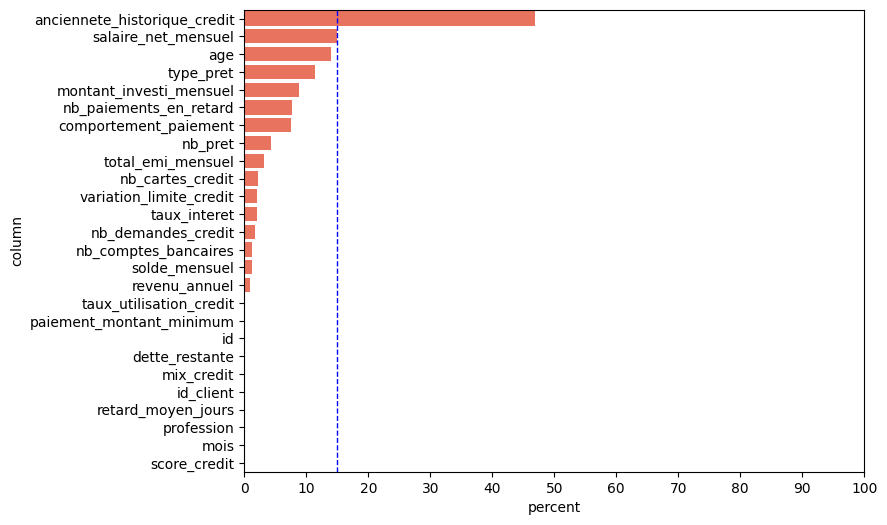

In [155]:
visual_nan(data_coherent, 15)

### Imputer valeur manquantes

In [156]:
data_coherent.T

,0,1,2,3,4,5,6,7,8,9,...,99990,99991,99992,99993,99994,99995,99996,99997,99998,99999
id,0x1602,0x1603,0x1604,0x1605,0x1606,0x1607,0x1608,0x1609,0x160e,0x160f,...,0x25fe0,0x25fe1,0x25fe6,0x25fe7,0x25fe8,0x25fe9,0x25fea,0x25feb,0x25fec,0x25fed
id_client,CUS_0xd40,CUS_0xd40,CUS_0xd40,CUS_0xd40,CUS_0xd40,CUS_0xd40,CUS_0xd40,CUS_0xd40,CUS_0x21b1,CUS_0x21b1,...,CUS_0x8600,CUS_0x8600,CUS_0x942c,CUS_0x942c,CUS_0x942c,CUS_0x942c,CUS_0x942c,CUS_0x942c,CUS_0x942c,CUS_0x942c
mois,Janvier,Février,Mars,Avril,Mai,Juin,Juillet,Août,Janvier,Février,...,Juillet,Août,Janvier,Février,Mars,Avril,Mai,Juin,Juillet,Août
age,23.00,23.00,23.00,23.00,23.00,23.00,23.00,23.00,28.00,28.00,...,28.00,29.00,24.00,25.00,25.00,25.00,25.00,25.00,25.00,25.00
profession,Scientifique,Scientifique,Scientifique,Scientifique,Scientifique,Scientifique,Scientifique,Scientifique,Enseignant,Enseignant,...,Architecte,Architecte,Mécanicien,Mécanicien,Mécanicien,Mécanicien,Mécanicien,Mécanicien,Mécanicien,Mécanicien
revenu_annuel,19114.12,19114.12,19114.12,19114.12,19114.12,19114.12,19114.12,19114.12,34847.84,34847.84,...,20002.88,20002.88,39628.99,39628.99,39628.99,39628.99,39628.99,39628.99,39628.99,39628.99
salaire_net_mensuel,1824.84,NaN,NaN,NaN,1824.84,NaN,1824.84,1824.84,3037.99,3037.99,...,1929.91,1929.91,3359.42,3359.42,3359.42,3359.42,3359.42,3359.42,3359.42,3359.42
nb_comptes_bancaires,3.00,3.00,3.00,3.00,3.00,3.00,3.00,3.00,2.00,2.00,...,10.00,10.00,4.00,4.00,4.00,4.00,4.00,4.00,4.00,4.00
nb_cartes_credit,4.00,4.00,4.00,4.00,4.00,4.00,4.00,4.00,4.00,4.00,...,8.00,8.00,6.00,6.00,6.00,6.00,6.00,6.00,6.00,6.00
taux_interet,3.00,3.00,3.00,3.00,3.00,3.00,3.00,3.00,6.00,6.00,...,29.00,29.00,7.00,7.00,7.00,7.00,7.00,NaN,7.00,7.00


In [157]:
data_imputer_id_client = data_coherent.copy()

In [158]:
# remplacer valeur manquants par groupby 'id_client'
# col_group_by_id_client = ['total_emi_mensuel', 'nb_cartes_credit', 'taux_interet', 'age', 'nb_demandes_credit', 'nb_comptes_bancaires', 'revenu_annuel', 'dette_restante', 'nb_pret']
col_imputer_par_id_client = ['age', 'salaire_net_mensuel', 'type_pret', 'nb_pret', 'total_emi_mensuel', 'nb_cartes_credit', 'taux_interet', 'nb_demandes_credit', 'nb_comptes_bancaires', 'revenu_annuel']
for col in col_imputer_par_id_client:
    data_imputer_id_client[col] = data_imputer_id_client.groupby('id_client')[col].transform(
        lambda x: x.fillna(x.mode()[0] if not x.mode().empty else np.nan)
    )


# # Có thể thêm điều kiện an toàn
# for col in col_imputer_par_id_client:
#     data_imputer_id_client[col] = data_imputer_id_client.groupby('id_client')[col].transform(
#         lambda x: x.fillna(x.mode()[0]) if (not x.mode().empty) and (x.nunique() <= 2) else x
#         # Chỉ impute bằng mode nếu biến thực sự constant (≤2 giá trị)
#     )
    

anciennete_historique_credit    46819
age                             13968
type_pret                       11408
montant_investi_mensuel          8851
nb_paiements_en_retard           7738
comportement_paiement            7600
variation_limite_credit          2091
solde_mensuel                    1209
total_emi_mensuel                   0
paiement_montant_minimum            0
taux_utilisation_credit             0
dette_restante                      0
mix_credit                          0
nb_demandes_credit                  0
id                                  0
id_client                           0
retard_moyen_jours                  0
nb_pret                             0
taux_interet                        0
nb_cartes_credit                    0
nb_comptes_bancaires                0
salaire_net_mensuel                 0
revenu_annuel                       0
profession                          0
mois                                0
score_credit                        0
dtype: int64

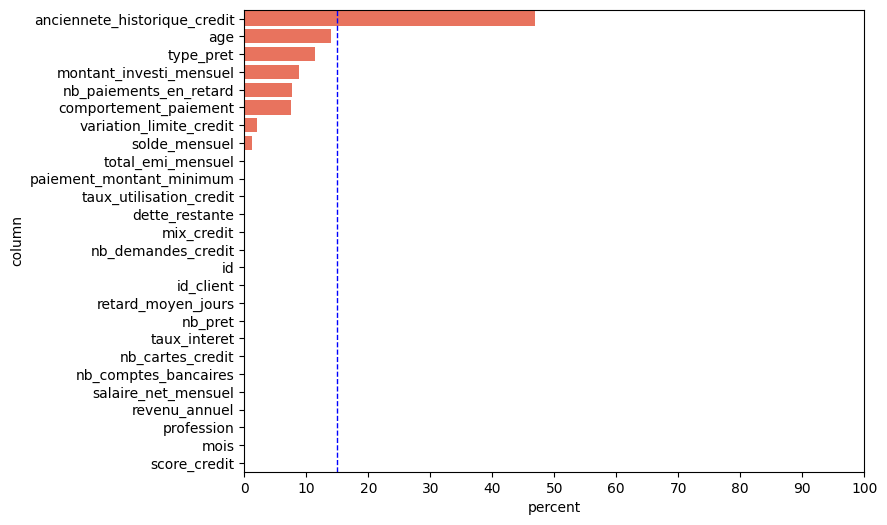

In [159]:
visual_nan(data_imputer_id_client, 15)

In [160]:
data_imputer_id_client.describe()

,age,revenu_annuel,salaire_net_mensuel,nb_comptes_bancaires,nb_cartes_credit,taux_interet,nb_pret,retard_moyen_jours,nb_paiements_en_retard,variation_limite_credit,nb_demandes_credit,dette_restante,taux_utilisation_credit,anciennete_historique_credit,total_emi_mensuel,montant_investi_mensuel,solde_mensuel
count,86032.00,100000.00,100000.00,100000.00,100000.00,100000.00,100000.00,100000.00,92262.00,97909.00,100000.00,100000.00,100000.00,53181.00,100000.00,91149.00,98791.00
mean,35.76,50505.12,4198.35,5.37,5.53,14.53,3.53,21.10,13.34,10.47,5.78,1426.22,32.29,186.28,107.23,194.45,402.55
std,9.52,38299.42,3187.40,2.59,2.07,8.74,2.45,14.82,6.26,6.67,3.86,1155.13,5.12,94.91,130.04,195.50,213.93
min,18.00,7005.93,303.65,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.23,20.00,1.00,0.00,0.00,0.01
25%,28.00,19342.97,1626.76,3.00,4.00,7.00,2.00,10.00,9.00,5.35,3.00,566.07,28.05,108.00,29.23,72.21,270.11
50%,35.00,36999.71,3095.98,5.00,5.00,13.00,3.00,18.00,14.00,9.40,5.00,1166.15,32.31,188.00,66.42,128.86,336.73
75%,43.00,71683.47,5961.64,7.00,7.00,20.00,5.00,28.00,18.00,14.87,8.00,1945.96,36.50,247.00,147.05,236.40,470.26
max,56.00,179987.28,15204.63,11.00,11.00,34.00,9.00,67.00,28.00,36.97,17.00,4998.07,50.00,404.00,1698.00,1497.71,1602.04


In [161]:
# data_IQR.to_csv('data_IQR_clean.csv', index=False)

### Remplace des valeurs manquantes avec modele Machine Learning

In [230]:
# data_clean = pd.read_csv('data_IQR_clean.csv')
data_imputer_ML = data_imputer_id_client.drop_duplicates(subset=['id_client', 'mois'])

In [231]:
print(data_imputer_ML.shape)
data_imputer_ML.T
# data_imputer_ML[data_imputer_ML['id_client'] == 'CUS_0x8600']
# CUS_0x8600

(100000, 26)


,0,1,2,3,4,5,6,7,8,9,...,99990,99991,99992,99993,99994,99995,99996,99997,99998,99999
id,0x1602,0x1603,0x1604,0x1605,0x1606,0x1607,0x1608,0x1609,0x160e,0x160f,...,0x25fe0,0x25fe1,0x25fe6,0x25fe7,0x25fe8,0x25fe9,0x25fea,0x25feb,0x25fec,0x25fed
id_client,CUS_0xd40,CUS_0xd40,CUS_0xd40,CUS_0xd40,CUS_0xd40,CUS_0xd40,CUS_0xd40,CUS_0xd40,CUS_0x21b1,CUS_0x21b1,...,CUS_0x8600,CUS_0x8600,CUS_0x942c,CUS_0x942c,CUS_0x942c,CUS_0x942c,CUS_0x942c,CUS_0x942c,CUS_0x942c,CUS_0x942c
mois,Janvier,Février,Mars,Avril,Mai,Juin,Juillet,Août,Janvier,Février,...,Juillet,Août,Janvier,Février,Mars,Avril,Mai,Juin,Juillet,Août
age,23.00,23.00,23.00,23.00,23.00,23.00,23.00,23.00,28.00,28.00,...,28.00,29.00,24.00,25.00,25.00,25.00,25.00,25.00,25.00,25.00
profession,Scientifique,Scientifique,Scientifique,Scientifique,Scientifique,Scientifique,Scientifique,Scientifique,Enseignant,Enseignant,...,Architecte,Architecte,Mécanicien,Mécanicien,Mécanicien,Mécanicien,Mécanicien,Mécanicien,Mécanicien,Mécanicien
revenu_annuel,19114.12,19114.12,19114.12,19114.12,19114.12,19114.12,19114.12,19114.12,34847.84,34847.84,...,20002.88,20002.88,39628.99,39628.99,39628.99,39628.99,39628.99,39628.99,39628.99,39628.99
salaire_net_mensuel,1824.84,1824.84,1824.84,1824.84,1824.84,1824.84,1824.84,1824.84,3037.99,3037.99,...,1929.91,1929.91,3359.42,3359.42,3359.42,3359.42,3359.42,3359.42,3359.42,3359.42
nb_comptes_bancaires,3.00,3.00,3.00,3.00,3.00,3.00,3.00,3.00,2.00,2.00,...,10.00,10.00,4.00,4.00,4.00,4.00,4.00,4.00,4.00,4.00
nb_cartes_credit,4.00,4.00,4.00,4.00,4.00,4.00,4.00,4.00,4.00,4.00,...,8.00,8.00,6.00,6.00,6.00,6.00,6.00,6.00,6.00,6.00
taux_interet,3.00,3.00,3.00,3.00,3.00,3.00,3.00,3.00,6.00,6.00,...,29.00,29.00,7.00,7.00,7.00,7.00,7.00,7.00,7.00,7.00


In [232]:
col_ML_inutile = ['id', 'id_client', 'mois']
col_categorie_ML = ['type_pret', 'comportement_paiement', ]
col_numeric_ML = ['age', 'anciennete_historique_credit', 'montant_investi_mensuel', 'nb_paiements_en_retard', 'variation_limite_credit', 'solde_mensuel']

In [233]:
col_ML_train = data_imputer_ML.columns.to_list()
col_ML_train = [col for col in col_ML_train if col not in col_categorie_ML and col not in col_numeric_ML and col not in col_ML_inutile]
data_train = data_imputer_ML[col_ML_train]
data_train.shape

(100000, 15)

In [234]:
# # col_manquant_quantitatif = ['montant_investi_mensuel', 'anciennete_historique_credit', 'solde_mensuel', 'nb_paiements_en_retard', 'dette_restante', 'total_emi_mensuel', 'variation_limite_credit', 'revenu_annuel']
# # col_manquant_qualitatif = ['type_pret', 'comportement_paiement']
# data_train['age'] = data_imputer_ML['age']
# data_train.shape


# # Ordinal Encoding mappings
# encoding_maps = {
#     'mix_credit': {'Bad': 0, 'Standard': 1, 'Good': 2},
#     'score_credit': {'Faible': 0, 'Moyen': 1, 'Bon': 2},
#     'paiement_montant_minimum': {'Non': 0, 'Non mentionné': 1, 'Oui': 2}
# }

# # Áp dụng encoding
# for col, mapping in encoding_maps.items():
#     data_train[col] = data_train[col].map(mapping)

# # Target Encoding cho profession
# from sklearn.preprocessing import LabelEncoder
# le = LabelEncoder()
# data_train['profession'] = le.fit_transform(data_train['profession'])

# # from category_encoders import TargetEncoder
# # encoder = TargetEncoder()
# # data_train['profession_encoded'] = encoder.fit_transform(data_train['profession'], df['score_credit_encoded'])


# df_age_test = data_train[data_train['age'].isna()]
# X_test_age = df_age_test.drop(columns='age')
# y_test_age = df_age_test[['age']]

# df_age_train = data_train.dropna()
# X_age = df_age_train.drop(columns='age')
# y_age = df_age_train[['age']]

# print(f'X_age {X_age.shape}')
# print(f'y_age {y_age.shape}')
# print(f'X_test_age {X_test_age.shape}')
# print(f'y_test_age {y_test_age.shape}')

In [235]:
from sklearn.preprocessing import LabelEncoder
# Ordinal Encoding mappings
encoding_maps = {
    'mix_credit': {'Bad': 0, 'Standard': 1, 'Good': 2},
    'score_credit': {'Faible': 0, 'Moyen': 1, 'Bon': 2},
    'paiement_montant_minimum': {'Non': 0, 'Non mentionné': 1, 'Oui': 2}
}

# Áp dụng encoding
for col, mapping in encoding_maps.items():
    data_train[col] = data_train[col].map(mapping)

# Target Encoding cho profession
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
data_train['profession'] = le.fit_transform(data_train['profession'])

In [236]:
def split_df(df, col):
    X = df.drop(columns=col)
    y = df[[col]]
    return X, y

In [237]:
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import r2_score
def train_and_evaluate_knn(X_train,  X_test, y_train, y_test, nbr_voisins):
    knn = KNeighborsRegressor(n_neighbors=nbr_voisins)
    knn.fit(X_train, y_train)
    y_pred = knn.predict(X_test)
    r2 = r2_score(y_test, y_pred)
    
    return r2

In [238]:
def trace_R2_knn(X_train,  X_test, y_train, y_test, k_range):
    R2_score = []
    for k in k_range:
        r2 = train_and_evaluate_knn(X_train,  X_test, y_train, y_test, k)
        R2_score.append(r2)
    best_k = k_range[np.argmax(R2_score)]
    best_r2 = max(R2_score)
    # plt.plot(k_range, R2_score, marker='o', color='green',label="R2")
    # plt.axvline(best_k, color='red', linestyle='--', label=f"best_k : {best_k}, best_r2 : {best_r2:.2f}")
    # plt.xticks(k_range)
    # plt.xlabel("Valeur de k")
    # plt.ylabel("Valeur de R2")
    # plt.title("R2 en fonction de k")
    # plt.grid()
    # plt.legend()
    # plt.show()

    return best_k, best_r2

In [239]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR

def train_and_rf(X_train,  X_test, y_train, y_test):
    rf = RandomForestRegressor(n_estimators=100, random_state=42)
    rf.fit(X_train, y_train)
    y_pred = rf.predict(X_test)
    r2 = r2_score(y_test, y_pred)
    return r2
    
    # Feature importance
    # if r2_rf > 0.3:
    #     feature_importance = pd.DataFrame({
    #         'feature': range(X_train_age_scaled.shape[1]),
    #         'importance': rf.feature_importances_
    #     }).sort_values('importance', ascending=False)
    #     print("Top 10 features quan trọng:")
    #     print(feature_importance.head(10))

In [240]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

for col in col_numeric_ML:    
    data_train[col] = data_imputer_ML[col]
    
    df_test = data_train[data_train[col].isna()]
    X_test, y_test = split_df(df_test, col)
    
    df_pre_train = data_train.dropna()
    X_pre_train, y_pre_train = split_df(df_pre_train, col)
    
    X_train_age, X_val_age, y_train_age, y_val_age = train_test_split(X_pre_train, y_pre_train, test_size=0.3, random_state=42)

    scaler = StandardScaler()
    X_train_age_scaled = scaler.fit_transform(X_train_age)
    X_val_age_scaled = scaler.transform(X_val_age)

    k_range = (3, 31, 5)
    best_k_knn, best_r2_knn = trace_R2_knn(X_train_age_scaled, X_val_age_scaled, y_train_age, y_val_age, k_range)
    r2_lr = train_and_rf(X_train_age_scaled, X_val_age_scaled, y_train_age, y_val_age)
    
    print(f'Feature : {col}')
    if r2_lr > best_r2_knn:
        print(f'Random Forest Regressor {r2_lr:.2f}')
    else:
        print(f'Knn Regressor {best_r2_knn:.2f} avec k:{best_k_knn}')

Feature : age
Random Forest Regressor 0.94
Feature : anciennete_historique_credit
Random Forest Regressor 0.98
Feature : montant_investi_mensuel
Knn Regressor 0.40 avec k:31
Feature : nb_paiements_en_retard
Random Forest Regressor 0.92
Feature : variation_limite_credit
Random Forest Regressor 0.83
Feature : solde_mensuel
Random Forest Regressor 0.99


In [222]:
# # X_age['paiement_montant_minimum'].unique()
# count_all = X_age['mix_credit'].value_counts()
# print("Số lượng từng giá trị:")
# print(count_all)
# data_train.T
# data_train.isnull().sum()

In [223]:
# # Tạo bảng chéo
# cross_tab = pd.crosstab(
#     X_age['paiement_montant_minimum'], 
#     X_age['score_credit'],
#     margins=True
# )

# print("CROSS-TABULATION:")
# print(cross_tab)

In [224]:
# plt.figure(figsize=(12, 6))
# cross_tab.plot(kind='bar', stacked=True)
# plt.title('Phân bố Score Crédit theo Paiement Minimum')
# plt.ylabel('Tỷ lệ %')
# plt.xticks(rotation=0)
# plt.legend(title='Score Crédit')
# plt.show()

In [225]:
# # data_clean['type_pret_2'] = (
# #     data_clean['type_pret']
# #     .apply(lambda x: ', '.join(sorted(set(str(x).split(',')))).strip())
# # )
# data_clean['type_pret_test'] = data_clean['type_pret'].apply(lambda x: ', '.join(list(set(x.split(', ') if pd.notna(x) else []))))
# from sklearn.model_selection import train_test_split
# X_train_age, X_val_age, y_train_age, y_val_age = train_test_split(X_age, y_age, test_size=0.3, random_state=42)
# print(f'X_train_age {X_train_age.shape}')
# print(f'y_train_age {y_train_age.shape}')
# print(f'X_val_age {X_val_age.shape}')
# print(f'y_val_age {y_val_age.shape}')

In [226]:
# from sklearn.preprocessing import StandardScaler
# scaler = StandardScaler()

# X_train_age_scaled = scaler.fit_transform(X_train_age)
# X_val_age_scaled = scaler.transform(X_val_age)

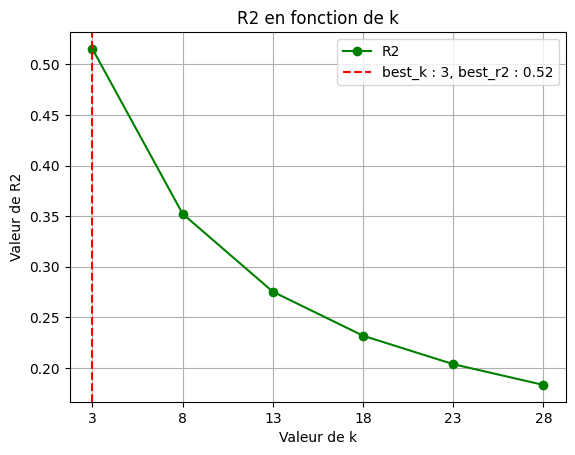

(3, 0.5153048048816029)

In [227]:
trace_R2_knn(X_train_age_scaled, X_val_age_scaled, y_train_age, y_val_age, range(3, 31, 5))

In [228]:
from sklearn.linear_model import LinearRegression

# Khởi tạo và huấn luyện model
lr = LinearRegression()
lr.fit(X_train_age_scaled, y_train_age)

# Dự đoán
y_pred_age_lr = lr.predict(X_val_age_scaled)

# Đánh giá hiệu suất
r2 = r2_score(y_val_age, y_pred_age_lr)

print("=== LINEAR REGRESSION RESULTS ===")
print(f"R² Score: {r2:.4f}")

=== LINEAR REGRESSION RESULTS ===
R² Score: 0.0555
